In [6]:
import os
import torch
import pandas as pd

from utils.data_processing import *
from utils.statistic_tests import *
from utils.vizualization import *

os.environ['CUDA_VISIBLE_DEVICES'] = "1"
torch.cuda.is_available()

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## BERT-large

In [3]:
model = bert_large_model
tokenizer = bert_large_tokenizer
print(f"{model.config._name_or_path} has {model.config.num_hidden_layers} hidden layers.")

# Preprocessing 
data_df = retrieve_preprocessed_df("../data/en_TaskIndependentData.json",print_ignored=True, tokenizer=tokenizer) 
data_df.head()


bert-large-uncased has 24 hidden layers.
We drop 777 ProperNoun and MetaUsage rows out of 4645.
Number of dropped single-meaning-mwe rows: 3200
Only MWEs that are tokenized like row['mwe'].split() have been retrieved at this step.      Specifically, we kept MWEs split into 2 tokens, in the singular form, and no different form from the MWE string ('running' != 'run').      To see the ignored rows, set print_ignored=True.
21 rows dropped where MWE not found as sublist in sentence.
There are 1,941 remaining sentences in the dataset.


,id,mwe,literal_meaning,_1,_2,_3,0/1,fine_grained,prior,sentence,after,prior_tokens,sentence_tokens,after_tokens,tokenized_mwe,normalized_sentence_tokens
0,38,sacred cow,divine cow,above criticism,None,None,1,divine cow,"Like beef, pork is also forbidden in Hinduism.","However, unlike the sacred cow, the pig repres...",This is considered to be particularly impure a...,"[like, beef, ,, pork, is, also, forbidden, in,...","[however, ,, unlike, the, sacred, cow, ,, the,...","[this, is, considered, to, be, particularly, i...","[sacred, cow]","[however, ,, unlike, the, sacred, cow, ,, the,..."
1,38,sacred cow,divine cow,above criticism,None,None,0,above criticism,"Besides, the Rights group said the Minister of...",The Rights group said the ministry has continu...,HURIWA recalled that the Federal Government on...,"[besides, ,, the, rights, group, said, the, mi...","[the, rights, group, said, the, ministry, has,...","[hu, ##ri, ##wa, recalled, that, the, federal,...","[sacred, cow]","[the, rights, group, said, the, ministry, has,..."
2,38,sacred cow,divine cow,above criticism,None,None,0,above criticism,"But in the Macquarie judgment, Judge Sandy Str...",Barwick says historically there has been littl...,The Fair Work Act is clear that employers cann...,"[but, in, the, macquarie, judgment, ,, judge, ...","[bar, ##wick, says, historically, there, has, ...","[the, fair, work, act, is, clear, that, employ...","[sacred, cow]","[bar, wick, says, historically, there, has, be..."
3,38,sacred cow,divine cow,above criticism,None,None,0,above criticism,"The Commissioner of Police, CP Abutu Yaro, who...",The state police boss also directed the full e...,No stone would be left unturned because we are...,"[the, commissioner, of, police, ,, cp, abu, ##...","[the, state, police, boss, also, directed, the...","[no, stone, would, be, left, un, ##turn, ##ed,...","[sacred, cow]","[the, state, police, boss, also, directed, the..."
4,38,sacred cow,divine cow,above criticism,None,None,0,above criticism,The committee shall come up with findings and ...,There is no sacred cow under the law of probit...,"For a deterrent in future, the Chairman shall ...","[the, committee, shall, come, up, with, findin...","[there, is, no, sacred, cow, under, the, law, ...","[for, a, deter, ##rent, in, future, ,, the, ch...","[sacred, cow]","[there, is, no, sacred, cow, under, the, law, ..."


In [4]:
selected_pairs, pair_info = create_literal_idiomatic_pairs(data_df, unique_occurrences=False)
pair_df = get_pair_info_df(pair_info)
pair_df['difference'] = pair_df.apply(lambda row: compute_difference(row, 'literal', 'idiomatic'), axis=1)
pair_df['most_represented'] = pair_df.apply(get_most_represented, axis=1)
pair_df = pair_df[pair_df['literal'] > 3]
pair_df = pair_df.sort_index()
pair_df

mwe,literal,idiomatic,difference,most_represented
acid test,7,9,2,idiomatic
ancient history,15,7,8,literal
baby blues,17,3,14,literal
bad hat,9,8,1,literal
best man,10,10,0,equal
big fish,7,4,3,literal
blue blood,4,13,9,idiomatic
brass ring,9,17,8,idiomatic
brick wall,9,8,1,literal
closed book,7,8,1,idiomatic


[acid test] Layer 0
Training accuracy: 44% => not linearly separable
[acid test] Layer 1
Training accuracy: 88% => not linearly separable
[acid test] Layer 2
Training accuracy: 100% => linearly separable
[acid test] Layer 3
Training accuracy: 100% => linearly separable
[acid test] Layer 4
Training accuracy: 100% => linearly separable
[acid test] Layer 5
Training accuracy: 100% => linearly separable
[acid test] Layer 6
Training accuracy: 100% => linearly separable
[acid test] Layer 7
Training accuracy: 100% => linearly separable
[acid test] Layer 8
Training accuracy: 100% => linearly separable
[acid test] Layer 9
Training accuracy: 100% => linearly separable
[acid test] Layer 10
Training accuracy: 100% => linearly separable
[acid test] Layer 11
Training accuracy: 100% => linearly separable
[acid test] Layer 12
Training accuracy: 94% => not linearly separable
[acid test] Layer 13
Training accuracy: 100% => linearly separable
[acid test] Layer 14
Training accuracy: 100% => linearly separa

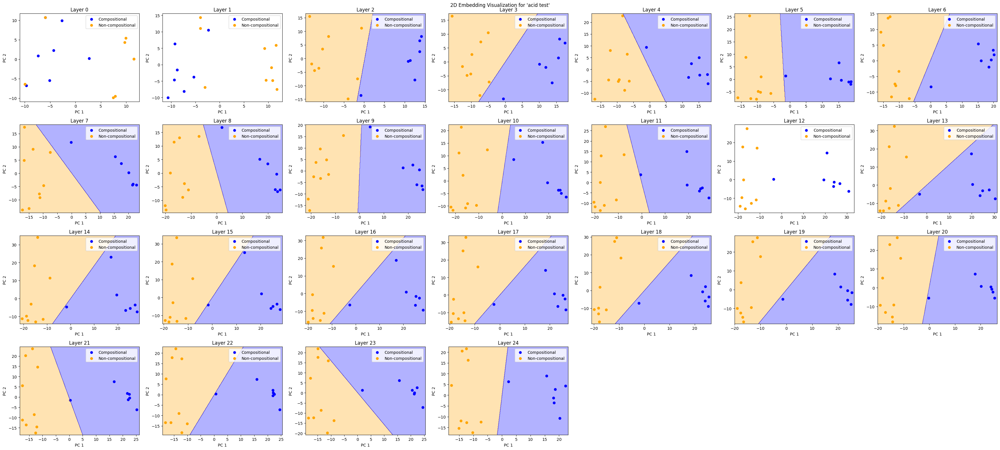

[ancient history] Layer 0
Training accuracy: 45% => not linearly separable
[ancient history] Layer 1
Training accuracy: 77% => not linearly separable
[ancient history] Layer 2
Training accuracy: 82% => not linearly separable
[ancient history] Layer 3
Training accuracy: 73% => not linearly separable
[ancient history] Layer 4
Training accuracy: 82% => not linearly separable
[ancient history] Layer 5
Training accuracy: 82% => not linearly separable
[ancient history] Layer 6
Training accuracy: 77% => not linearly separable
[ancient history] Layer 7
Training accuracy: 77% => not linearly separable
[ancient history] Layer 8
Training accuracy: 77% => not linearly separable
[ancient history] Layer 9
Training accuracy: 82% => not linearly separable
[ancient history] Layer 10
Training accuracy: 82% => not linearly separable
[ancient history] Layer 11
Training accuracy: 82% => not linearly separable
[ancient history] Layer 12
Training accuracy: 68% => not linearly separable
[ancient history] Laye

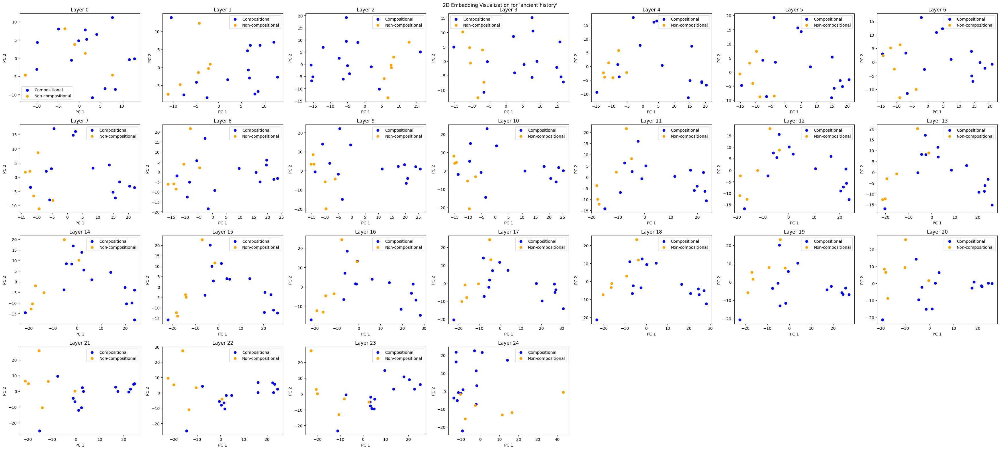

[baby blues] Layer 0
Training accuracy: 75% => not linearly separable
[baby blues] Layer 1
Training accuracy: 75% => not linearly separable
[baby blues] Layer 2
Training accuracy: 70% => not linearly separable
[baby blues] Layer 3
Training accuracy: 80% => not linearly separable
[baby blues] Layer 4
Training accuracy: 100% => linearly separable
[baby blues] Layer 5
Training accuracy: 100% => linearly separable
[baby blues] Layer 6
Training accuracy: 90% => not linearly separable
[baby blues] Layer 7
Training accuracy: 100% => linearly separable
[baby blues] Layer 8
Training accuracy: 90% => not linearly separable
[baby blues] Layer 9
Training accuracy: 100% => linearly separable
[baby blues] Layer 10
Training accuracy: 100% => linearly separable
[baby blues] Layer 11
Training accuracy: 65% => not linearly separable
[baby blues] Layer 12
Training accuracy: 100% => linearly separable
[baby blues] Layer 13
Training accuracy: 100% => linearly separable
[baby blues] Layer 14
Training accura

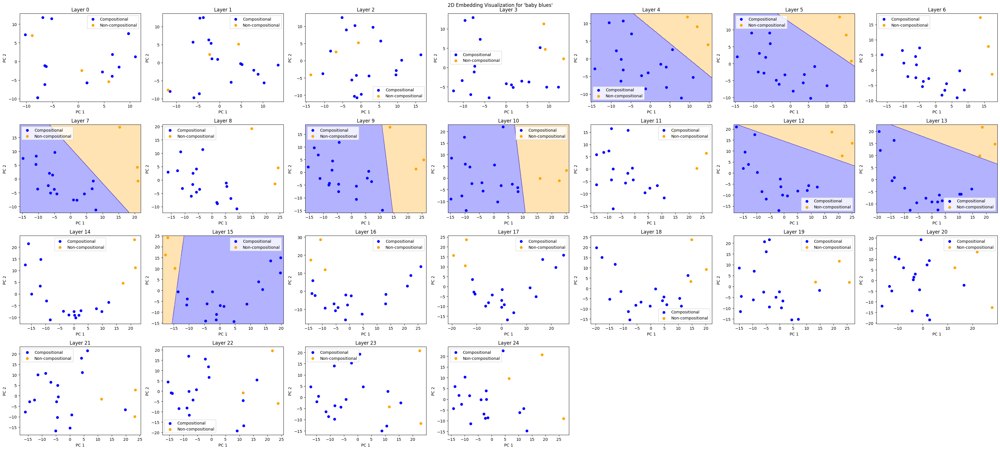

[bad hat] Layer 0
Training accuracy: 65% => not linearly separable
[bad hat] Layer 1
Training accuracy: 59% => not linearly separable
[bad hat] Layer 2
Training accuracy: 53% => not linearly separable
[bad hat] Layer 3
Training accuracy: 71% => not linearly separable
[bad hat] Layer 4
Training accuracy: 65% => not linearly separable
[bad hat] Layer 5
Training accuracy: 59% => not linearly separable
[bad hat] Layer 6
Training accuracy: 71% => not linearly separable
[bad hat] Layer 7
Training accuracy: 88% => not linearly separable
[bad hat] Layer 8
Training accuracy: 100% => linearly separable
[bad hat] Layer 9
Training accuracy: 100% => linearly separable
[bad hat] Layer 10
Training accuracy: 100% => linearly separable
[bad hat] Layer 11
Training accuracy: 100% => linearly separable
[bad hat] Layer 12
Training accuracy: 100% => linearly separable
[bad hat] Layer 13
Training accuracy: 76% => not linearly separable
[bad hat] Layer 14
Training accuracy: 82% => not linearly separable
[bad 

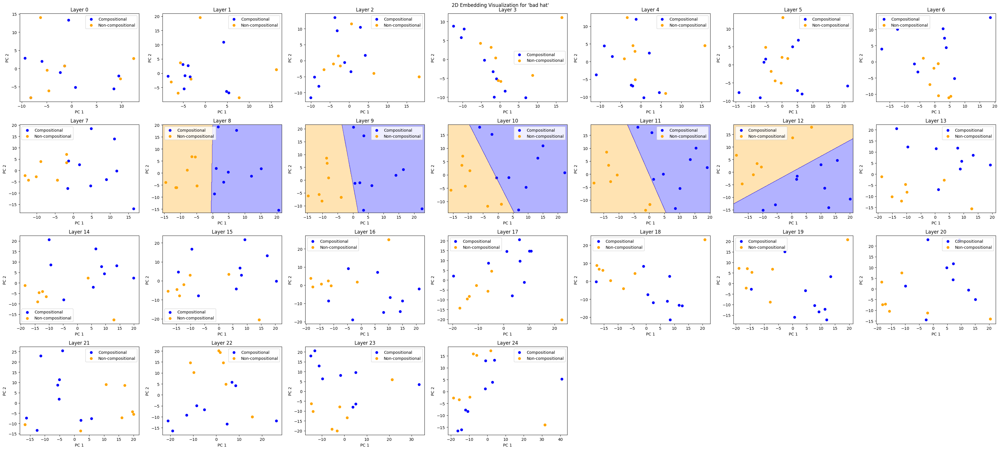

[best man] Layer 0
Training accuracy: 65% => not linearly separable
[best man] Layer 1
Training accuracy: 75% => not linearly separable
[best man] Layer 2
Training accuracy: 85% => not linearly separable
[best man] Layer 3
Training accuracy: 80% => not linearly separable
[best man] Layer 4
Training accuracy: 95% => not linearly separable
[best man] Layer 5
Training accuracy: 95% => not linearly separable
[best man] Layer 6
Training accuracy: 95% => not linearly separable
[best man] Layer 7
Training accuracy: 85% => not linearly separable
[best man] Layer 8
Training accuracy: 90% => not linearly separable
[best man] Layer 9
Training accuracy: 90% => not linearly separable
[best man] Layer 10
Training accuracy: 95% => not linearly separable
[best man] Layer 11
Training accuracy: 95% => not linearly separable
[best man] Layer 12
Training accuracy: 70% => not linearly separable
[best man] Layer 13
Training accuracy: 85% => not linearly separable
[best man] Layer 14
Training accuracy: 80% =

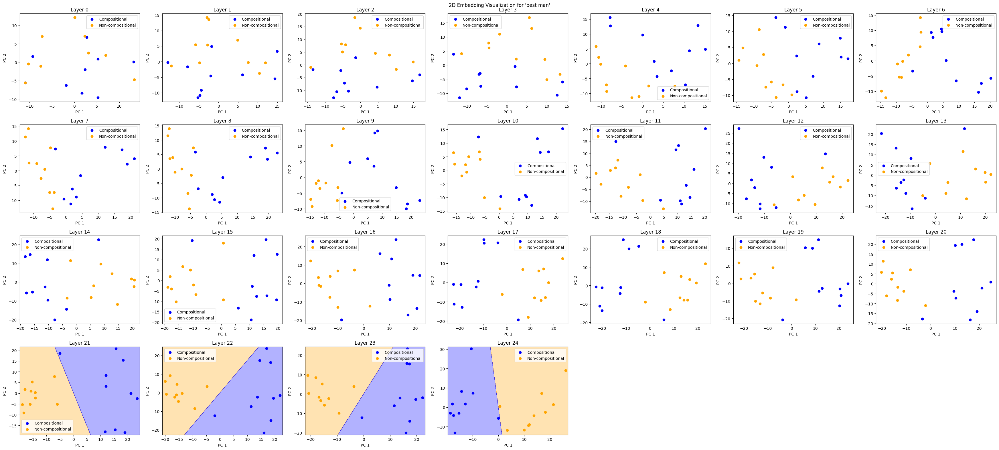

[big fish] Layer 0
Training accuracy: 64% => not linearly separable
[big fish] Layer 1
Training accuracy: 73% => not linearly separable
[big fish] Layer 2
Training accuracy: 64% => not linearly separable
[big fish] Layer 3
Training accuracy: 82% => not linearly separable
[big fish] Layer 4
Training accuracy: 55% => not linearly separable
[big fish] Layer 5
Training accuracy: 82% => not linearly separable
[big fish] Layer 6
Training accuracy: 100% => linearly separable
[big fish] Layer 7
Training accuracy: 100% => linearly separable
[big fish] Layer 8
Training accuracy: 100% => linearly separable
[big fish] Layer 9
Training accuracy: 100% => linearly separable
[big fish] Layer 10
Training accuracy: 91% => not linearly separable
[big fish] Layer 11
Training accuracy: 91% => not linearly separable
[big fish] Layer 12
Training accuracy: 91% => not linearly separable
[big fish] Layer 13
Training accuracy: 82% => not linearly separable
[big fish] Layer 14
Training accuracy: 73% => not linear

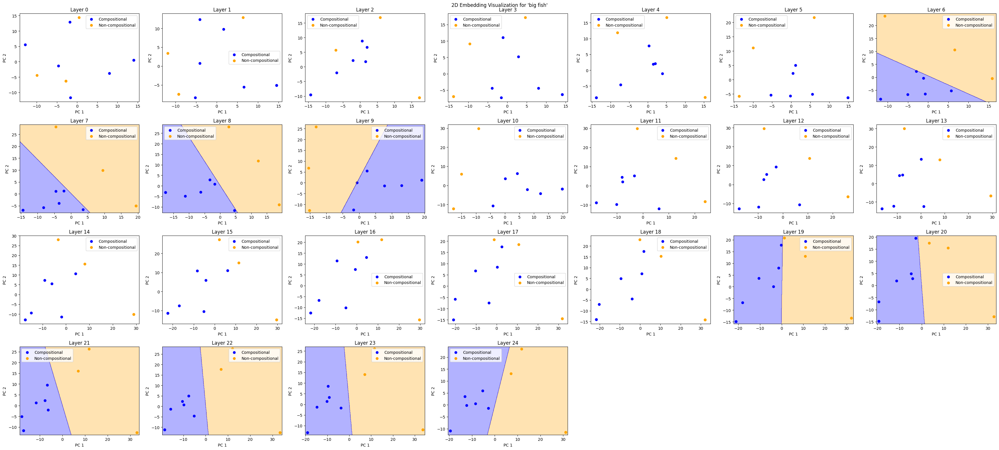

[blue blood] Layer 0
Training accuracy: 76% => not linearly separable
[blue blood] Layer 1
Training accuracy: 82% => not linearly separable
[blue blood] Layer 2
Training accuracy: 100% => linearly separable
[blue blood] Layer 3
Training accuracy: 100% => linearly separable
[blue blood] Layer 4
Training accuracy: 94% => not linearly separable
[blue blood] Layer 5
Training accuracy: 100% => linearly separable
[blue blood] Layer 6
Training accuracy: 76% => not linearly separable
[blue blood] Layer 7
Training accuracy: 94% => not linearly separable
[blue blood] Layer 8
Training accuracy: 76% => not linearly separable
[blue blood] Layer 9
Training accuracy: 94% => not linearly separable
[blue blood] Layer 10
Training accuracy: 82% => not linearly separable
[blue blood] Layer 11
Training accuracy: 94% => not linearly separable
[blue blood] Layer 12
Training accuracy: 94% => not linearly separable
[blue blood] Layer 13
Training accuracy: 94% => not linearly separable
[blue blood] Layer 14
Tra

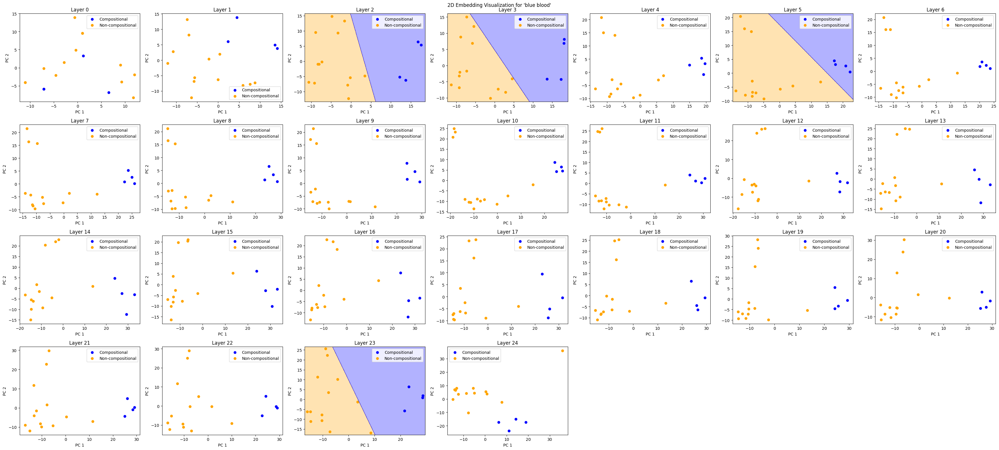

[brass ring] Layer 0
Training accuracy: 65% => not linearly separable
[brass ring] Layer 1
Training accuracy: 81% => not linearly separable
[brass ring] Layer 2
Training accuracy: 96% => not linearly separable
[brass ring] Layer 3
Training accuracy: 85% => not linearly separable
[brass ring] Layer 4
Training accuracy: 92% => not linearly separable
[brass ring] Layer 5
Training accuracy: 85% => not linearly separable
[brass ring] Layer 6
Training accuracy: 77% => not linearly separable
[brass ring] Layer 7
Training accuracy: 96% => not linearly separable
[brass ring] Layer 8
Training accuracy: 92% => not linearly separable
[brass ring] Layer 9
Training accuracy: 88% => not linearly separable
[brass ring] Layer 10
Training accuracy: 88% => not linearly separable
[brass ring] Layer 11
Training accuracy: 92% => not linearly separable
[brass ring] Layer 12
Training accuracy: 85% => not linearly separable
[brass ring] Layer 13
Training accuracy: 88% => not linearly separable
[brass ring] Lay

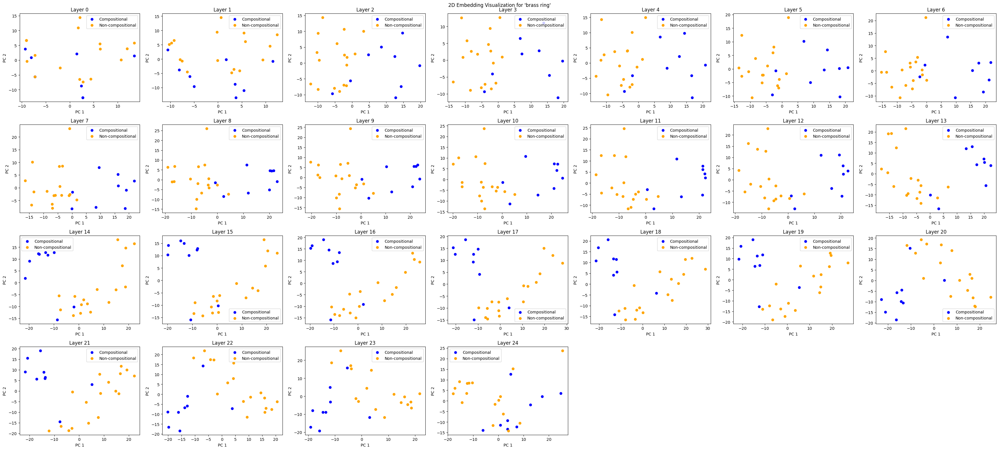

[brick wall] Layer 0
Training accuracy: 65% => not linearly separable
[brick wall] Layer 1
Training accuracy: 76% => not linearly separable
[brick wall] Layer 2
Training accuracy: 88% => not linearly separable
[brick wall] Layer 3
Training accuracy: 82% => not linearly separable
[brick wall] Layer 4
Training accuracy: 88% => not linearly separable
[brick wall] Layer 5
Training accuracy: 94% => not linearly separable
[brick wall] Layer 6
Training accuracy: 82% => not linearly separable
[brick wall] Layer 7
Training accuracy: 76% => not linearly separable
[brick wall] Layer 8
Training accuracy: 71% => not linearly separable
[brick wall] Layer 9
Training accuracy: 47% => not linearly separable
[brick wall] Layer 10
Training accuracy: 88% => not linearly separable
[brick wall] Layer 11
Training accuracy: 82% => not linearly separable
[brick wall] Layer 12
Training accuracy: 82% => not linearly separable
[brick wall] Layer 13
Training accuracy: 88% => not linearly separable
[brick wall] Lay

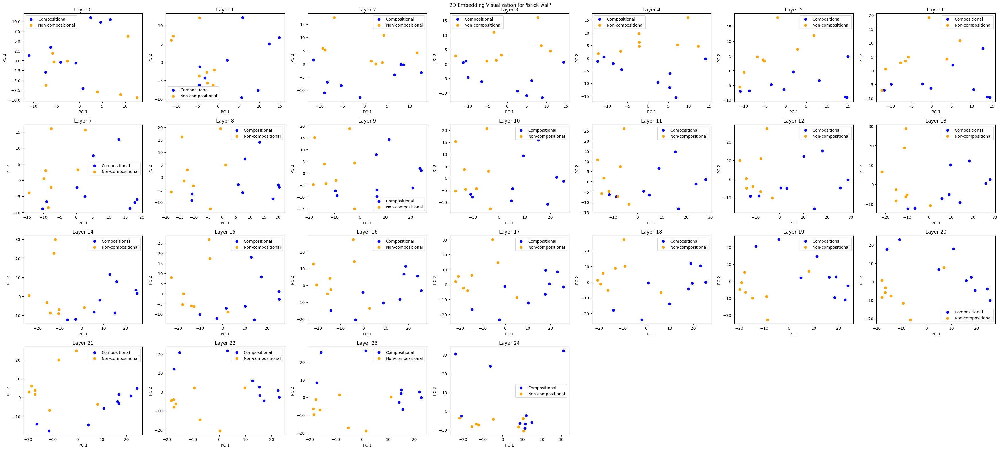

[closed book] Layer 0
Training accuracy: 53% => not linearly separable
[closed book] Layer 1
Training accuracy: 80% => not linearly separable
[closed book] Layer 2
Training accuracy: 93% => not linearly separable
[closed book] Layer 3
Training accuracy: 87% => not linearly separable
[closed book] Layer 4
Training accuracy: 93% => not linearly separable
[closed book] Layer 5
Training accuracy: 93% => not linearly separable
[closed book] Layer 6
Training accuracy: 100% => linearly separable
[closed book] Layer 7
Training accuracy: 100% => linearly separable
[closed book] Layer 8
Training accuracy: 100% => linearly separable
[closed book] Layer 9
Training accuracy: 100% => linearly separable
[closed book] Layer 10
Training accuracy: 100% => linearly separable
[closed book] Layer 11
Training accuracy: 100% => linearly separable
[closed book] Layer 12
Training accuracy: 100% => linearly separable
[closed book] Layer 13
Training accuracy: 100% => linearly separable
[closed book] Layer 14
Tra

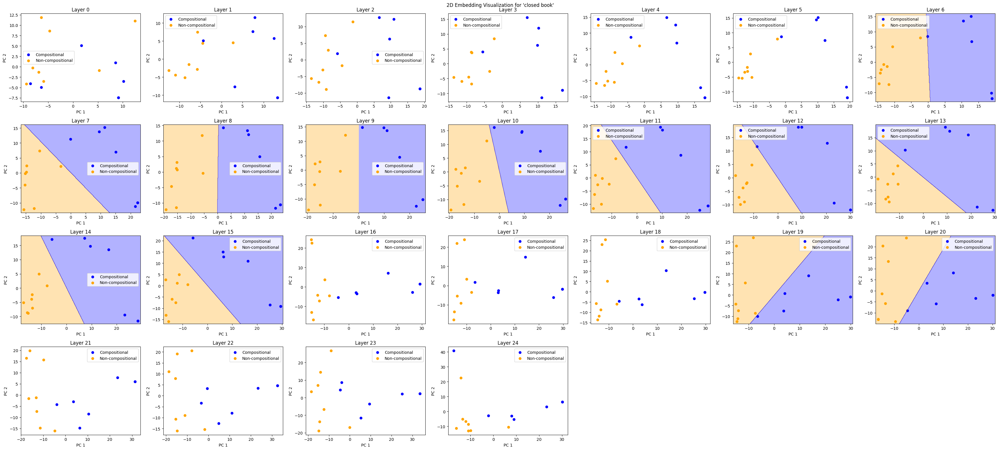

[cutting edge] Layer 0
Training accuracy: 56% => not linearly separable
[cutting edge] Layer 1
Training accuracy: 89% => not linearly separable
[cutting edge] Layer 2
Training accuracy: 100% => linearly separable
[cutting edge] Layer 3
Training accuracy: 100% => linearly separable
[cutting edge] Layer 4
Training accuracy: 100% => linearly separable
[cutting edge] Layer 5
Training accuracy: 100% => linearly separable
[cutting edge] Layer 6
Training accuracy: 100% => linearly separable
[cutting edge] Layer 7
Training accuracy: 100% => linearly separable
[cutting edge] Layer 8
Training accuracy: 100% => linearly separable
[cutting edge] Layer 9
Training accuracy: 100% => linearly separable
[cutting edge] Layer 10
Training accuracy: 100% => linearly separable
[cutting edge] Layer 11
Training accuracy: 100% => linearly separable
[cutting edge] Layer 12
Training accuracy: 100% => linearly separable
[cutting edge] Layer 13
Training accuracy: 100% => linearly separable
[cutting edge] Layer 14


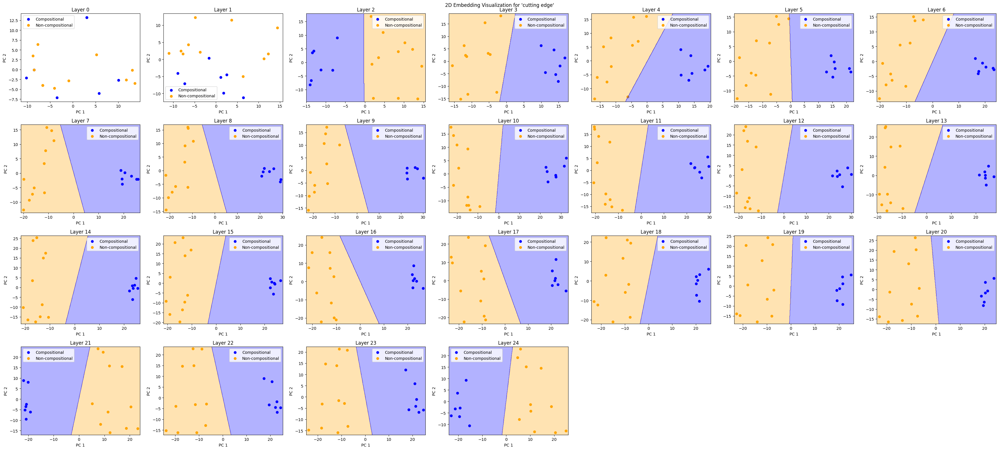

[dry land] Layer 0
Training accuracy: 57% => not linearly separable
[dry land] Layer 1
Training accuracy: 76% => not linearly separable
[dry land] Layer 2
Training accuracy: 90% => not linearly separable
[dry land] Layer 3
Training accuracy: 95% => not linearly separable
[dry land] Layer 4
Training accuracy: 90% => not linearly separable
[dry land] Layer 5
Training accuracy: 90% => not linearly separable
[dry land] Layer 6
Training accuracy: 95% => not linearly separable
[dry land] Layer 7
Training accuracy: 95% => not linearly separable
[dry land] Layer 8
Training accuracy: 95% => not linearly separable
[dry land] Layer 9
Training accuracy: 95% => not linearly separable
[dry land] Layer 10
Training accuracy: 95% => not linearly separable
[dry land] Layer 11
Training accuracy: 95% => not linearly separable
[dry land] Layer 12
Training accuracy: 90% => not linearly separable
[dry land] Layer 13
Training accuracy: 95% => not linearly separable
[dry land] Layer 14
Training accuracy: 95% =

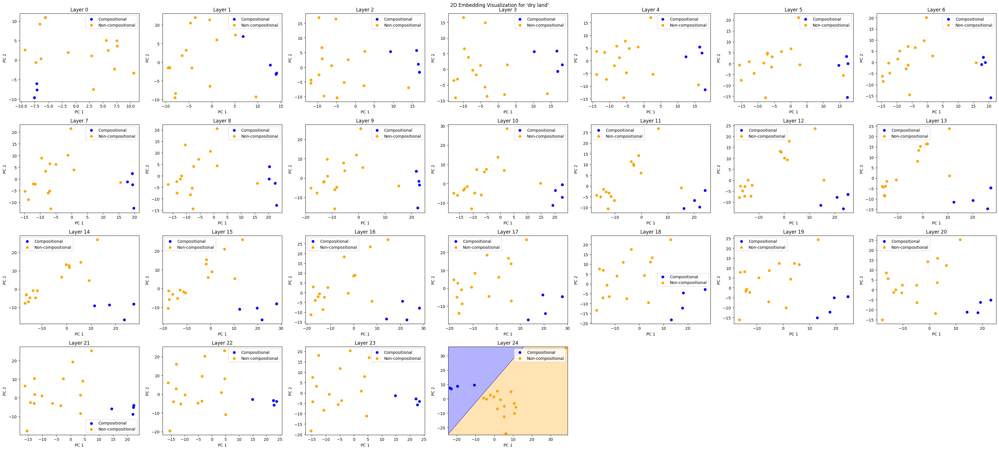

[fine line] Layer 0
Training accuracy: 54% => not linearly separable
[fine line] Layer 1
Training accuracy: 85% => not linearly separable
[fine line] Layer 2
Training accuracy: 69% => not linearly separable
[fine line] Layer 3
Training accuracy: 85% => not linearly separable
[fine line] Layer 4
Training accuracy: 100% => linearly separable
[fine line] Layer 5
Training accuracy: 100% => linearly separable
[fine line] Layer 6
Training accuracy: 100% => linearly separable
[fine line] Layer 7
Training accuracy: 100% => linearly separable
[fine line] Layer 8
Training accuracy: 100% => linearly separable
[fine line] Layer 9
Training accuracy: 100% => linearly separable
[fine line] Layer 10
Training accuracy: 100% => linearly separable
[fine line] Layer 11
Training accuracy: 100% => linearly separable
[fine line] Layer 12
Training accuracy: 100% => linearly separable
[fine line] Layer 13
Training accuracy: 100% => linearly separable
[fine line] Layer 14
Training accuracy: 100% => linearly sep

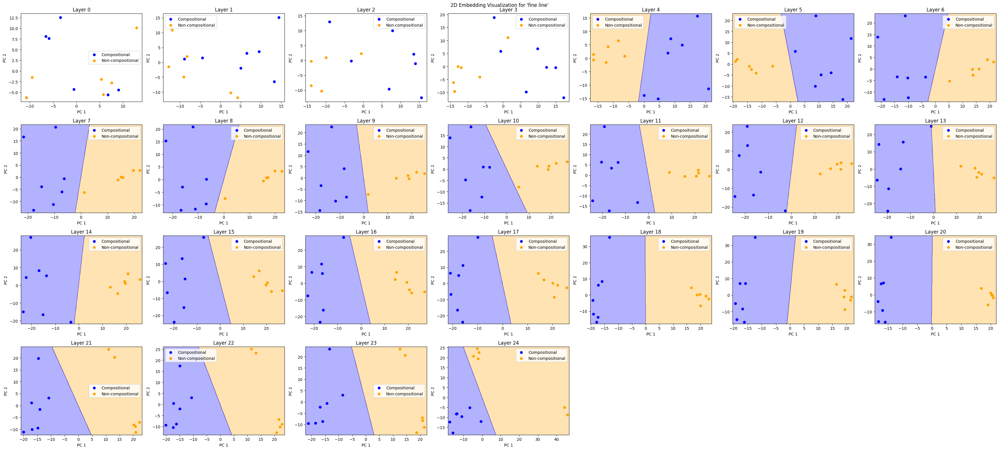

[gold mine] Layer 0
Training accuracy: 56% => not linearly separable
[gold mine] Layer 1
Training accuracy: 88% => not linearly separable
[gold mine] Layer 2
Training accuracy: 81% => not linearly separable
[gold mine] Layer 3
Training accuracy: 100% => linearly separable
[gold mine] Layer 4
Training accuracy: 100% => linearly separable
[gold mine] Layer 5
Training accuracy: 100% => linearly separable
[gold mine] Layer 6
Training accuracy: 100% => linearly separable
[gold mine] Layer 7
Training accuracy: 100% => linearly separable
[gold mine] Layer 8
Training accuracy: 100% => linearly separable
[gold mine] Layer 9
Training accuracy: 100% => linearly separable
[gold mine] Layer 10
Training accuracy: 100% => linearly separable
[gold mine] Layer 11
Training accuracy: 100% => linearly separable
[gold mine] Layer 12
Training accuracy: 100% => linearly separable
[gold mine] Layer 13
Training accuracy: 100% => linearly separable
[gold mine] Layer 14
Training accuracy: 100% => linearly separa

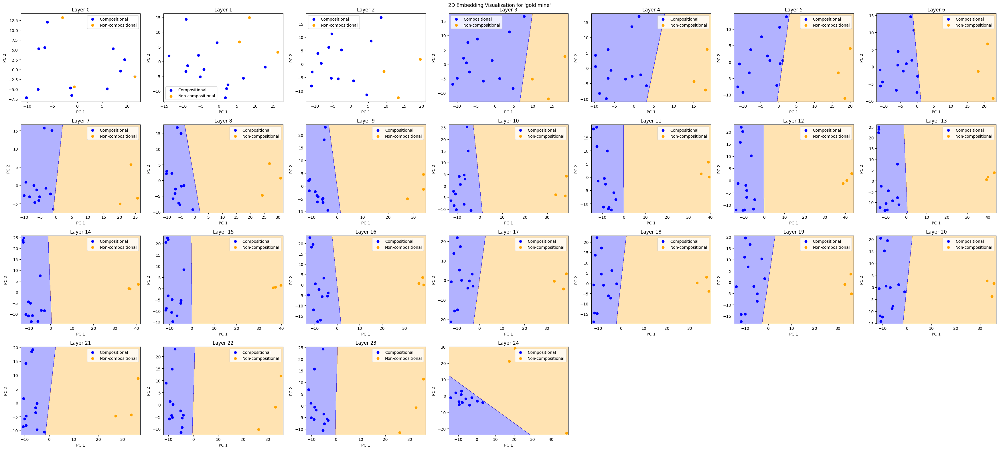

[ground floor] Layer 0
Training accuracy: 88% => not linearly separable
[ground floor] Layer 1
Training accuracy: 83% => not linearly separable
[ground floor] Layer 2
Training accuracy: 92% => not linearly separable
[ground floor] Layer 3
Training accuracy: 96% => not linearly separable
[ground floor] Layer 4
Training accuracy: 83% => not linearly separable
[ground floor] Layer 5
Training accuracy: 88% => not linearly separable
[ground floor] Layer 6
Training accuracy: 75% => not linearly separable
[ground floor] Layer 7
Training accuracy: 83% => not linearly separable
[ground floor] Layer 8
Training accuracy: 92% => not linearly separable
[ground floor] Layer 9
Training accuracy: 83% => not linearly separable
[ground floor] Layer 10
Training accuracy: 100% => linearly separable
[ground floor] Layer 11
Training accuracy: 83% => not linearly separable
[ground floor] Layer 12
Training accuracy: 75% => not linearly separable
[ground floor] Layer 13
Training accuracy: 75% => not linearly s

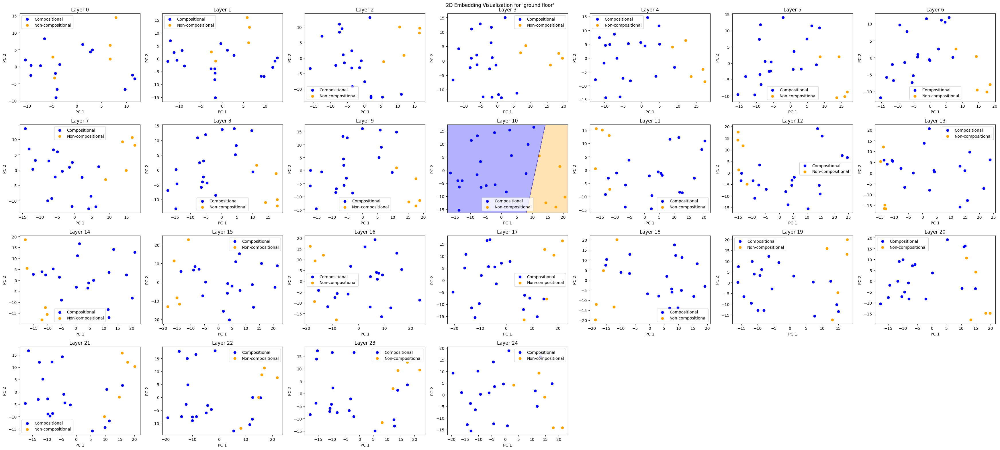

[rocket science] Layer 0
Training accuracy: 73% => not linearly separable
[rocket science] Layer 1
Training accuracy: 80% => not linearly separable
[rocket science] Layer 2
Training accuracy: 87% => not linearly separable
[rocket science] Layer 3
Training accuracy: 93% => not linearly separable
[rocket science] Layer 4
Training accuracy: 100% => linearly separable
[rocket science] Layer 5
Training accuracy: 100% => linearly separable
[rocket science] Layer 6
Training accuracy: 100% => linearly separable
[rocket science] Layer 7
Training accuracy: 100% => linearly separable
[rocket science] Layer 8
Training accuracy: 100% => linearly separable
[rocket science] Layer 9
Training accuracy: 100% => linearly separable
[rocket science] Layer 10
Training accuracy: 100% => linearly separable
[rocket science] Layer 11
Training accuracy: 100% => linearly separable
[rocket science] Layer 12
Training accuracy: 100% => linearly separable
[rocket science] Layer 13
Training accuracy: 100% => linearly 

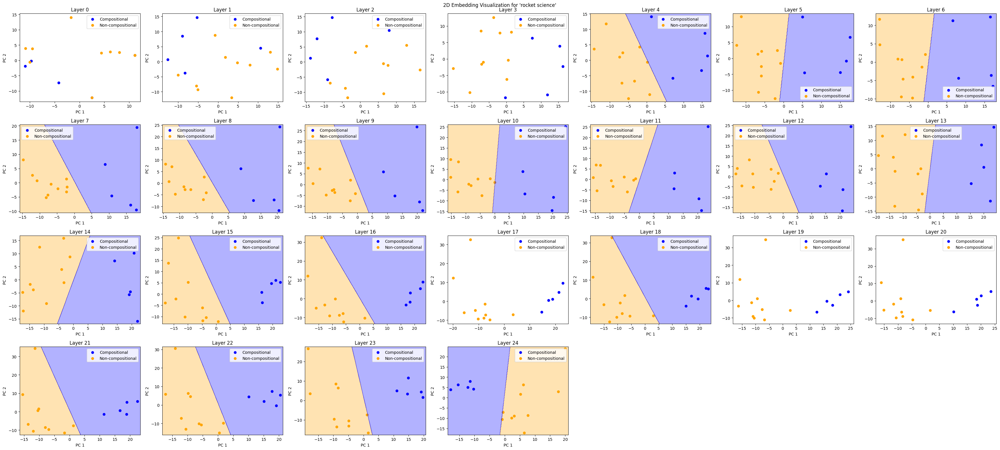

[silver spoon] Layer 0
Training accuracy: 69% => not linearly separable
[silver spoon] Layer 1
Training accuracy: 85% => not linearly separable
[silver spoon] Layer 2
Training accuracy: 100% => linearly separable
[silver spoon] Layer 3
Training accuracy: 100% => linearly separable
[silver spoon] Layer 4
Training accuracy: 100% => linearly separable
[silver spoon] Layer 5
Training accuracy: 100% => linearly separable
[silver spoon] Layer 6
Training accuracy: 100% => linearly separable
[silver spoon] Layer 7
Training accuracy: 100% => linearly separable
[silver spoon] Layer 8
Training accuracy: 100% => linearly separable
[silver spoon] Layer 9
Training accuracy: 100% => linearly separable
[silver spoon] Layer 10
Training accuracy: 100% => linearly separable
[silver spoon] Layer 11
Training accuracy: 100% => linearly separable
[silver spoon] Layer 12
Training accuracy: 100% => linearly separable
[silver spoon] Layer 13
Training accuracy: 100% => linearly separable
[silver spoon] Layer 14


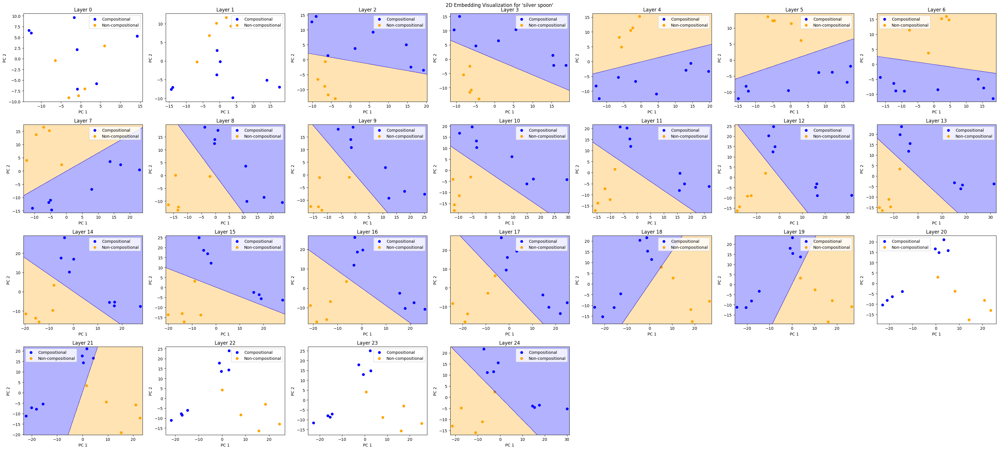

IndexError: list index out of range

In [8]:
all_accuracies = {}

for mwe in pair_df.index:
    acc = plot_decision_boundary_all_layers(mwe, data_df, tokenizer, model)
    all_accuracies[mwe] = acc





In [11]:


# Convert dict to DataFrame
df_accuracies = pd.DataFrame.from_dict(all_accuracies, orient="index")
df_accuracies.columns = [f"Layer_{i}" for i in range(len(df_accuracies.columns))]
df_accuracies.to_csv("all_accuracies.csv")

# Load from CSV
df_loaded = pd.read_csv("all_accuracies.csv", index_col=0)

# Convert back to dict format (with lists)
all_accuracies_loaded = df_loaded.to_dict(orient="index")
all_accuracies_loaded = {k: list(v.values()) for k, v in all_accuracies_loaded.items()}

latex_code = generate_latex_table(all_accuracies_loaded)
with open("linear_separability_table.tex", "w") as f:
    f.write(latex_code)



In [14]:
# Load from CSV
df_loaded = pd.read_csv("all_accuracies.csv", index_col=0)

# Convert back to dict format (with lists)
all_accuracies_loaded = df_loaded.to_dict(orient="index")
all_accuracies_loaded = {k: list(v.values()) for k, v in all_accuracies_loaded.items()}


In [16]:
latex_code = generate_latex_table(all_accuracies_loaded)
with open("linear_separability_table.tex", "w") as f:
    f.write(latex_code)


Layer 0
Training accuracy: 43.75% => data is not linearly separable.
Layer 1
Training accuracy: 87.50% => data is not linearly separable.
Layer 2
Training accuracy: 100.00% => data is linearly separable.
Layer 3
Training accuracy: 100.00% => data is linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 93.75% => data is not linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly separab

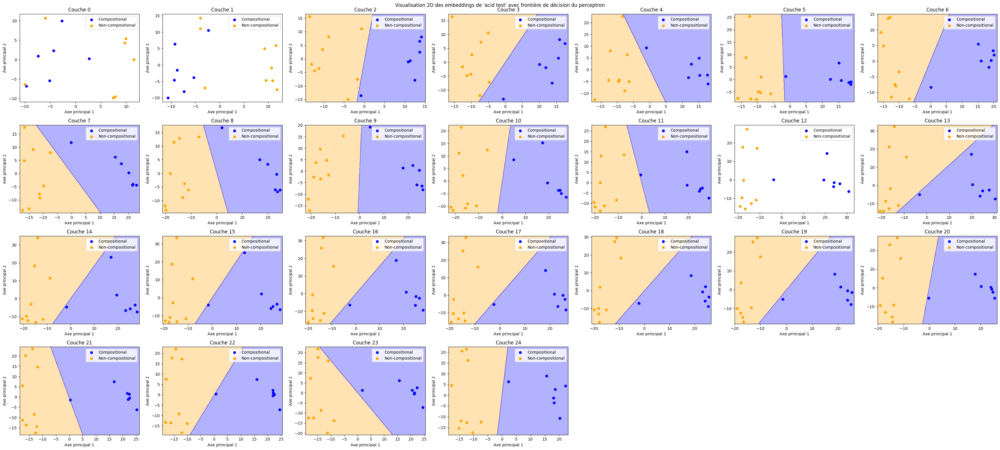

Layer 0
Training accuracy: 45.45% => data is not linearly separable.
Layer 1
Training accuracy: 77.27% => data is not linearly separable.
Layer 2
Training accuracy: 81.82% => data is not linearly separable.
Layer 3
Training accuracy: 72.73% => data is not linearly separable.
Layer 4
Training accuracy: 81.82% => data is not linearly separable.
Layer 5
Training accuracy: 81.82% => data is not linearly separable.
Layer 6
Training accuracy: 77.27% => data is not linearly separable.
Layer 7
Training accuracy: 77.27% => data is not linearly separable.
Layer 8
Training accuracy: 77.27% => data is not linearly separable.
Layer 9
Training accuracy: 81.82% => data is not linearly separable.
Layer 10
Training accuracy: 81.82% => data is not linearly separable.
Layer 11
Training accuracy: 81.82% => data is not linearly separable.
Layer 12
Training accuracy: 68.18% => data is not linearly separable.
Layer 13
Training accuracy: 68.18% => data is not linearly separable.
Layer 14
Training accuracy: 72

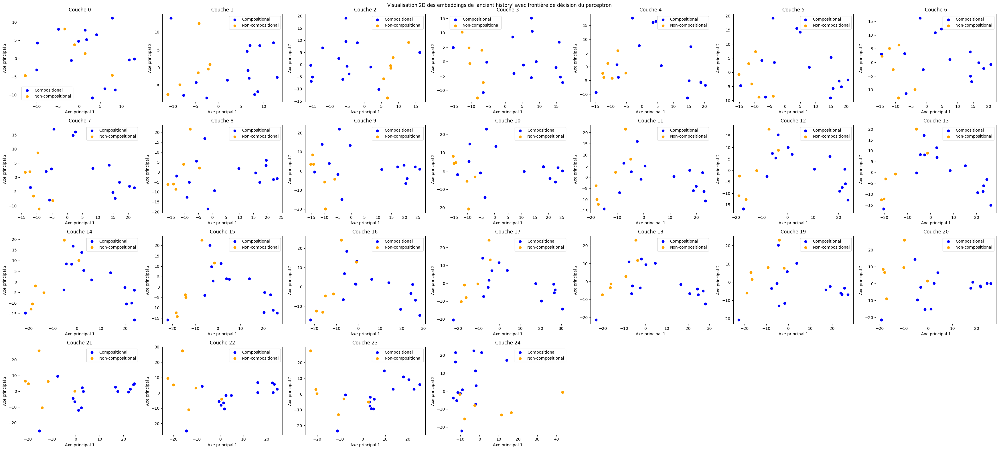

Layer 0
Training accuracy: 75.00% => data is not linearly separable.
Layer 1
Training accuracy: 75.00% => data is not linearly separable.
Layer 2
Training accuracy: 70.00% => data is not linearly separable.
Layer 3
Training accuracy: 80.00% => data is not linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 95.00% => data is not linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 85.00% => data is not linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 85.00% => data is not line

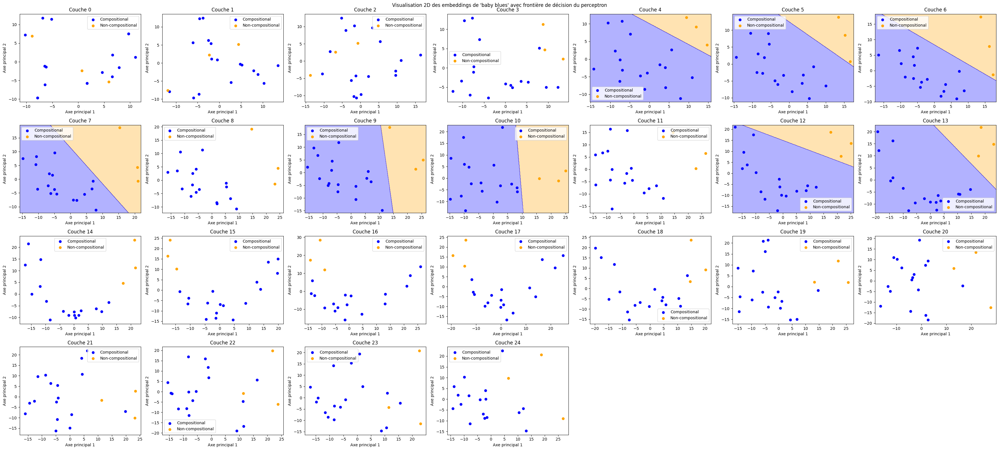

Layer 0
Training accuracy: 64.71% => data is not linearly separable.
Layer 1
Training accuracy: 58.82% => data is not linearly separable.
Layer 2
Training accuracy: 52.94% => data is not linearly separable.
Layer 3
Training accuracy: 82.35% => data is not linearly separable.
Layer 4
Training accuracy: 64.71% => data is not linearly separable.
Layer 5
Training accuracy: 64.71% => data is not linearly separable.
Layer 6
Training accuracy: 70.59% => data is not linearly separable.
Layer 7
Training accuracy: 88.24% => data is not linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 76.47% => data is not linearly separable.
Layer 14
Training accuracy: 58.82% => data is

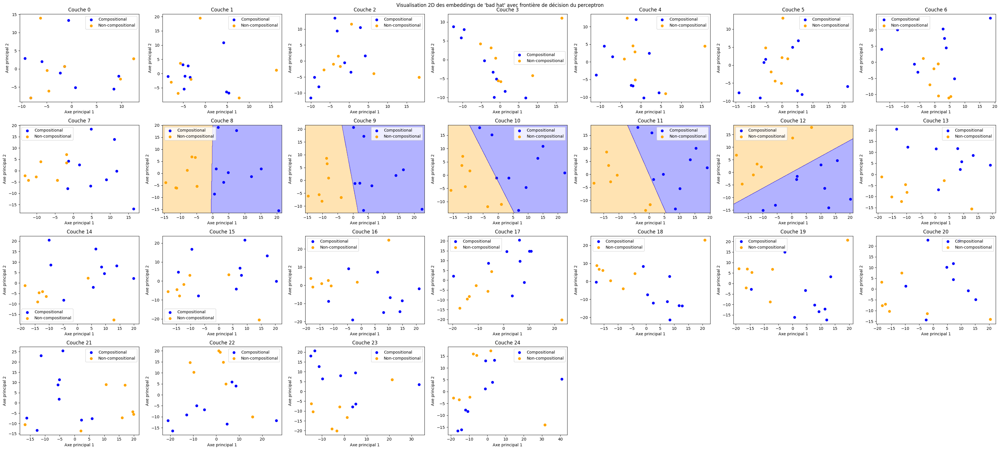

Layer 0
Training accuracy: 65.00% => data is not linearly separable.
Layer 1
Training accuracy: 75.00% => data is not linearly separable.
Layer 2
Training accuracy: 85.00% => data is not linearly separable.
Layer 3
Training accuracy: 80.00% => data is not linearly separable.
Layer 4
Training accuracy: 95.00% => data is not linearly separable.
Layer 5
Training accuracy: 95.00% => data is not linearly separable.
Layer 6
Training accuracy: 95.00% => data is not linearly separable.
Layer 7
Training accuracy: 95.00% => data is not linearly separable.
Layer 8
Training accuracy: 90.00% => data is not linearly separable.
Layer 9
Training accuracy: 90.00% => data is not linearly separable.
Layer 10
Training accuracy: 95.00% => data is not linearly separable.
Layer 11
Training accuracy: 95.00% => data is not linearly separable.
Layer 12
Training accuracy: 70.00% => data is not linearly separable.
Layer 13
Training accuracy: 85.00% => data is not linearly separable.
Layer 14
Training accuracy: 85

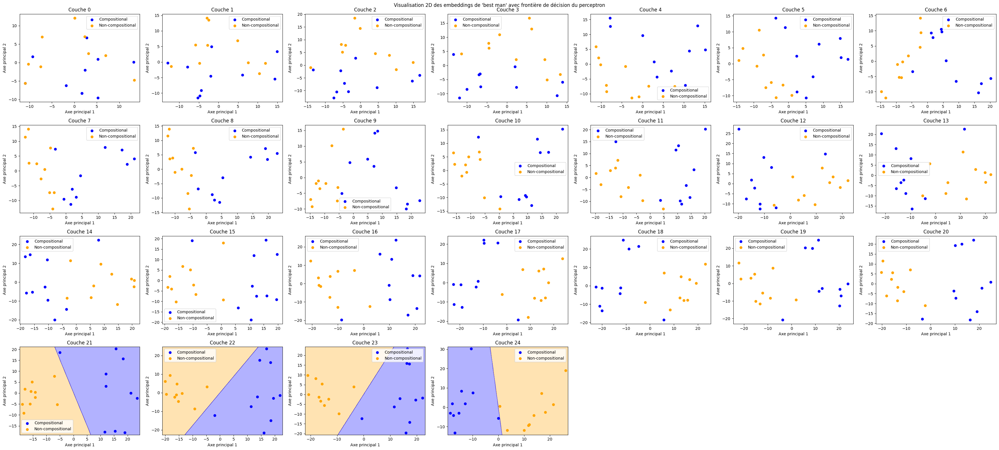

Layer 0
Training accuracy: 63.64% => data is not linearly separable.
Layer 1
Training accuracy: 72.73% => data is not linearly separable.
Layer 2
Training accuracy: 63.64% => data is not linearly separable.
Layer 3
Training accuracy: 81.82% => data is not linearly separable.
Layer 4
Training accuracy: 54.55% => data is not linearly separable.
Layer 5
Training accuracy: 81.82% => data is not linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 90.91% => data is not linearly separable.
Layer 11
Training accuracy: 90.91% => data is not linearly separable.
Layer 12
Training accuracy: 90.91% => data is not linearly separable.
Layer 13
Training accuracy: 81.82% => data is not linearly separable.
Layer 14
Training accuracy: 72.73% => data

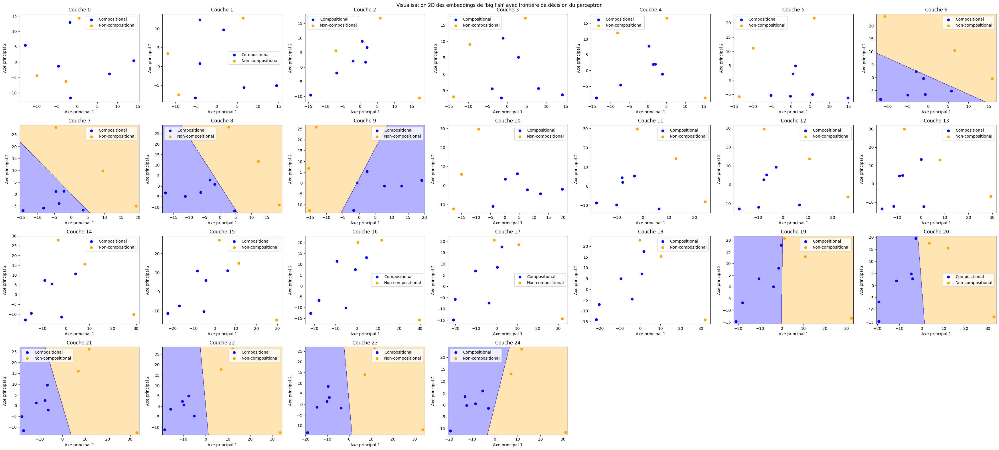

Layer 0
Training accuracy: 76.47% => data is not linearly separable.
Layer 1
Training accuracy: 82.35% => data is not linearly separable.
Layer 2
Training accuracy: 100.00% => data is linearly separable.
Layer 3
Training accuracy: 100.00% => data is linearly separable.
Layer 4
Training accuracy: 94.12% => data is not linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 76.47% => data is not linearly separable.
Layer 7
Training accuracy: 94.12% => data is not linearly separable.
Layer 8
Training accuracy: 76.47% => data is not linearly separable.
Layer 9
Training accuracy: 94.12% => data is not linearly separable.
Layer 10
Training accuracy: 82.35% => data is not linearly separable.
Layer 11
Training accuracy: 94.12% => data is not linearly separable.
Layer 12
Training accuracy: 94.12% => data is not linearly separable.
Layer 13
Training accuracy: 94.12% => data is not linearly separable.
Layer 14
Training accuracy: 94.12% => d

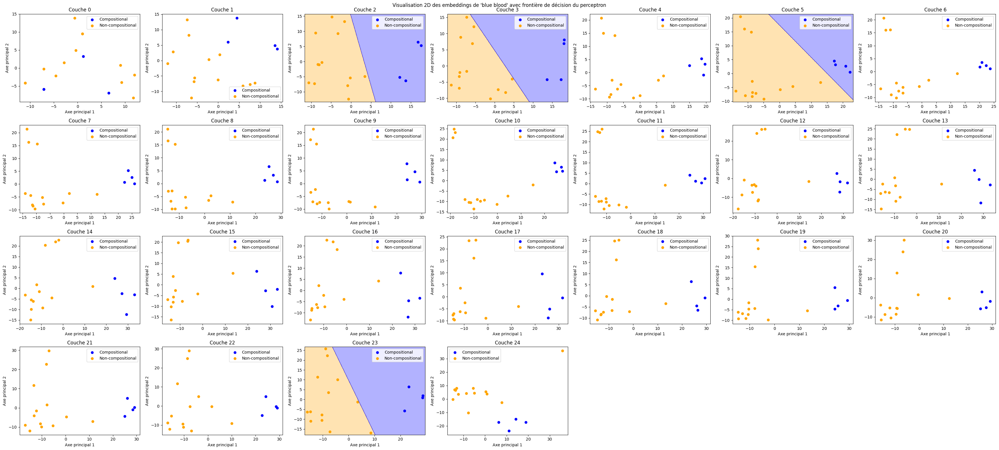

Layer 0
Training accuracy: 65.38% => data is not linearly separable.
Layer 1
Training accuracy: 80.77% => data is not linearly separable.
Layer 2
Training accuracy: 96.15% => data is not linearly separable.
Layer 3
Training accuracy: 84.62% => data is not linearly separable.
Layer 4
Training accuracy: 92.31% => data is not linearly separable.
Layer 5
Training accuracy: 84.62% => data is not linearly separable.
Layer 6
Training accuracy: 76.92% => data is not linearly separable.
Layer 7
Training accuracy: 96.15% => data is not linearly separable.
Layer 8
Training accuracy: 92.31% => data is not linearly separable.
Layer 9
Training accuracy: 88.46% => data is not linearly separable.
Layer 10
Training accuracy: 88.46% => data is not linearly separable.
Layer 11
Training accuracy: 92.31% => data is not linearly separable.
Layer 12
Training accuracy: 84.62% => data is not linearly separable.
Layer 13
Training accuracy: 88.46% => data is not linearly separable.
Layer 14
Training accuracy: 88

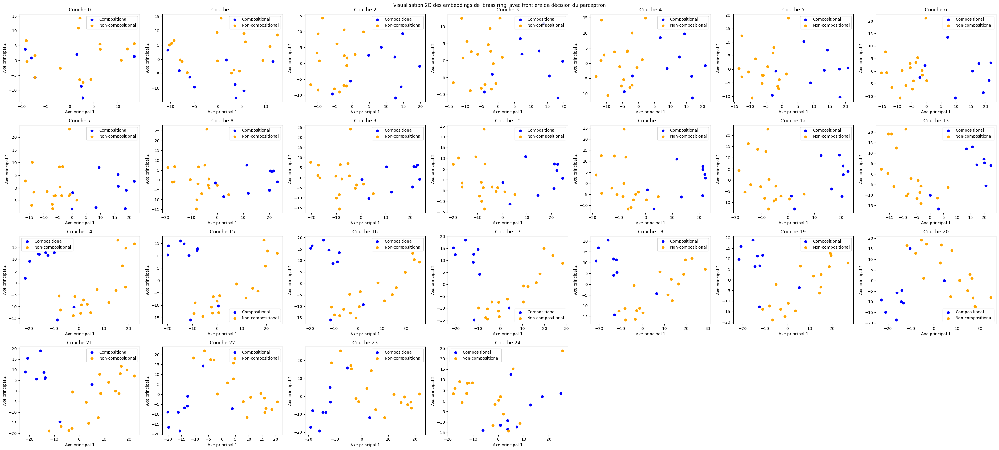

Layer 0
Training accuracy: 64.71% => data is not linearly separable.
Layer 1
Training accuracy: 76.47% => data is not linearly separable.
Layer 2
Training accuracy: 88.24% => data is not linearly separable.
Layer 3
Training accuracy: 82.35% => data is not linearly separable.
Layer 4
Training accuracy: 88.24% => data is not linearly separable.
Layer 5
Training accuracy: 94.12% => data is not linearly separable.
Layer 6
Training accuracy: 82.35% => data is not linearly separable.
Layer 7
Training accuracy: 76.47% => data is not linearly separable.
Layer 8
Training accuracy: 70.59% => data is not linearly separable.
Layer 9
Training accuracy: 47.06% => data is not linearly separable.
Layer 10
Training accuracy: 88.24% => data is not linearly separable.
Layer 11
Training accuracy: 82.35% => data is not linearly separable.
Layer 12
Training accuracy: 82.35% => data is not linearly separable.
Layer 13
Training accuracy: 88.24% => data is not linearly separable.
Layer 14
Training accuracy: 88

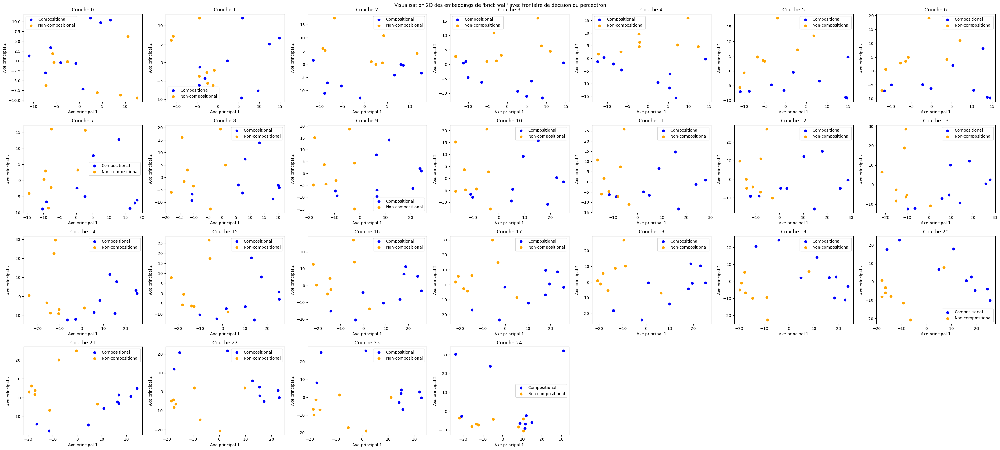

Layer 0
Training accuracy: 53.33% => data is not linearly separable.
Layer 1
Training accuracy: 80.00% => data is not linearly separable.
Layer 2
Training accuracy: 93.33% => data is not linearly separable.
Layer 3
Training accuracy: 86.67% => data is not linearly separable.
Layer 4
Training accuracy: 93.33% => data is not linearly separable.
Layer 5
Training accuracy: 93.33% => data is not linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearl

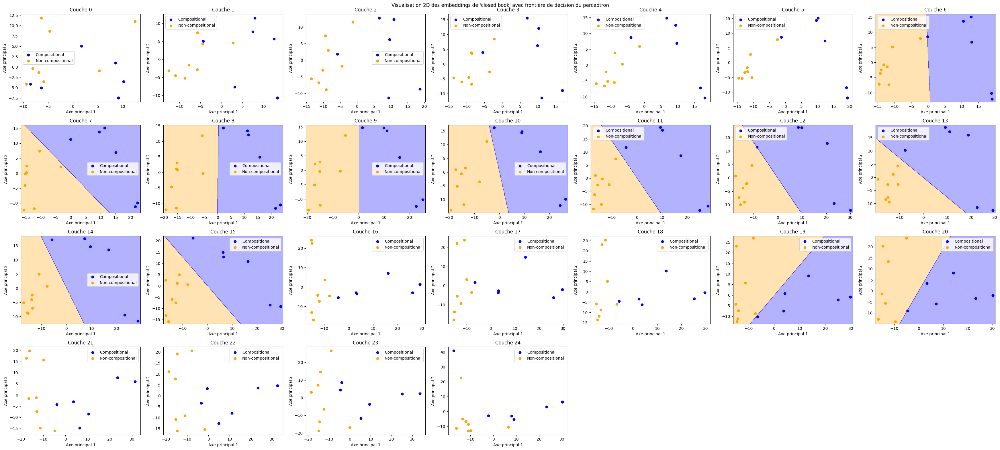

Layer 0
Training accuracy: 55.56% => data is not linearly separable.
Layer 1
Training accuracy: 88.89% => data is not linearly separable.
Layer 2
Training accuracy: 100.00% => data is linearly separable.
Layer 3
Training accuracy: 100.00% => data is linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly separable.

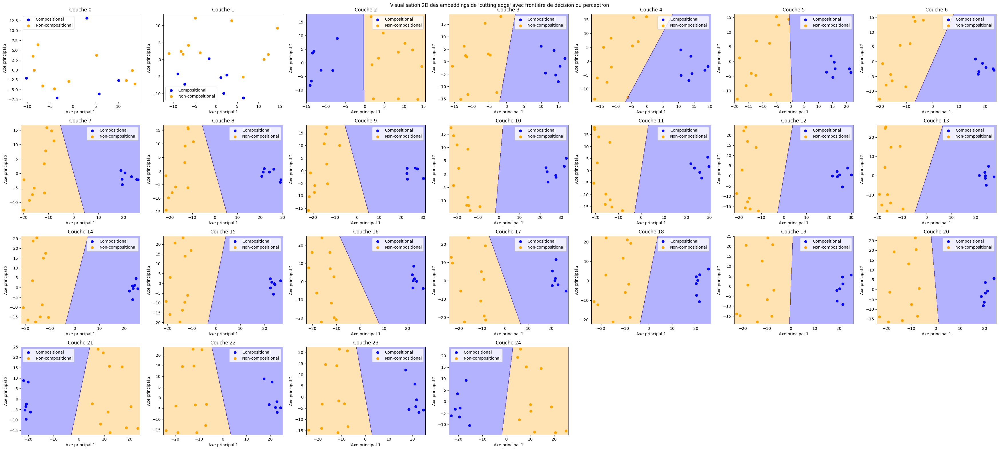

Layer 0
Training accuracy: 57.14% => data is not linearly separable.
Layer 1
Training accuracy: 76.19% => data is not linearly separable.
Layer 2
Training accuracy: 90.48% => data is not linearly separable.
Layer 3
Training accuracy: 95.24% => data is not linearly separable.
Layer 4
Training accuracy: 90.48% => data is not linearly separable.
Layer 5
Training accuracy: 90.48% => data is not linearly separable.
Layer 6
Training accuracy: 95.24% => data is not linearly separable.
Layer 7
Training accuracy: 95.24% => data is not linearly separable.
Layer 8
Training accuracy: 95.24% => data is not linearly separable.
Layer 9
Training accuracy: 95.24% => data is not linearly separable.
Layer 10
Training accuracy: 95.24% => data is not linearly separable.
Layer 11
Training accuracy: 95.24% => data is not linearly separable.
Layer 12
Training accuracy: 90.48% => data is not linearly separable.
Layer 13
Training accuracy: 95.24% => data is not linearly separable.
Layer 14
Training accuracy: 95

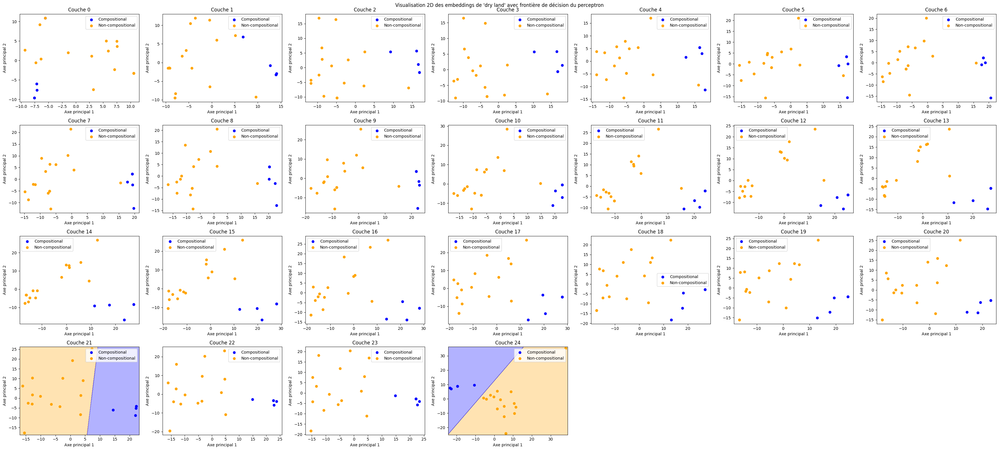

Layer 0
Training accuracy: 53.85% => data is not linearly separable.
Layer 1
Training accuracy: 84.62% => data is not linearly separable.
Layer 2
Training accuracy: 69.23% => data is not linearly separable.
Layer 3
Training accuracy: 84.62% => data is not linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly sepa

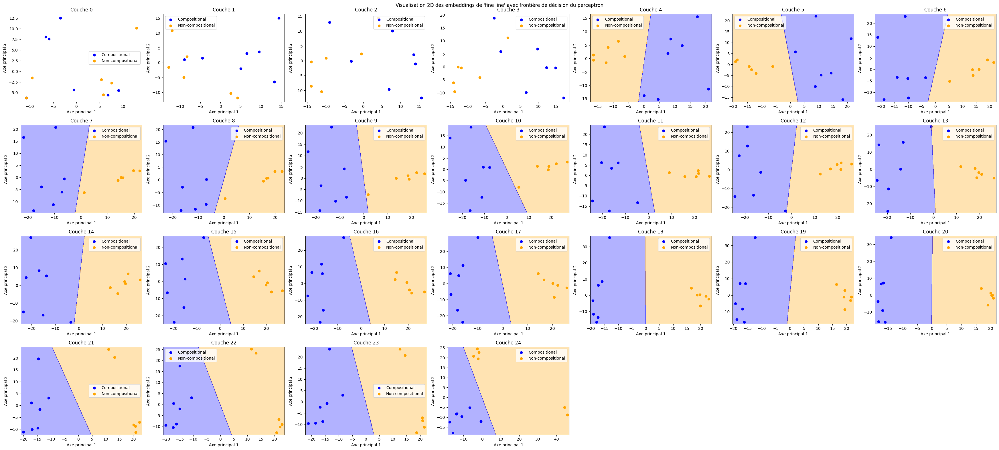

Layer 0
Training accuracy: 56.25% => data is not linearly separable.
Layer 1
Training accuracy: 87.50% => data is not linearly separable.
Layer 2
Training accuracy: 81.25% => data is not linearly separable.
Layer 3
Training accuracy: 100.00% => data is linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly separab

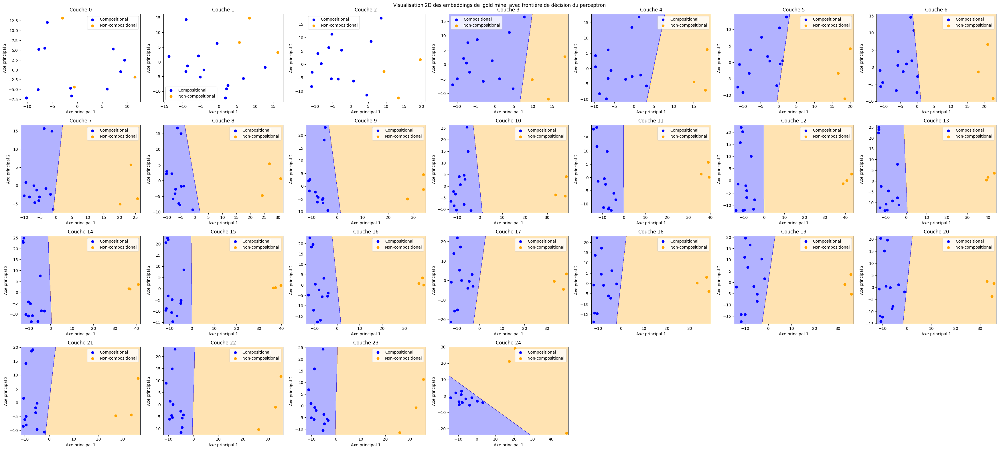

Layer 0
Training accuracy: 87.50% => data is not linearly separable.
Layer 1
Training accuracy: 83.33% => data is not linearly separable.
Layer 2
Training accuracy: 91.67% => data is not linearly separable.
Layer 3
Training accuracy: 95.83% => data is not linearly separable.
Layer 4
Training accuracy: 83.33% => data is not linearly separable.
Layer 5
Training accuracy: 87.50% => data is not linearly separable.
Layer 6
Training accuracy: 75.00% => data is not linearly separable.
Layer 7
Training accuracy: 83.33% => data is not linearly separable.
Layer 8
Training accuracy: 91.67% => data is not linearly separable.
Layer 9
Training accuracy: 83.33% => data is not linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 83.33% => data is not linearly separable.
Layer 12
Training accuracy: 75.00% => data is not linearly separable.
Layer 13
Training accuracy: 75.00% => data is not linearly separable.
Layer 14
Training accuracy: 83.33

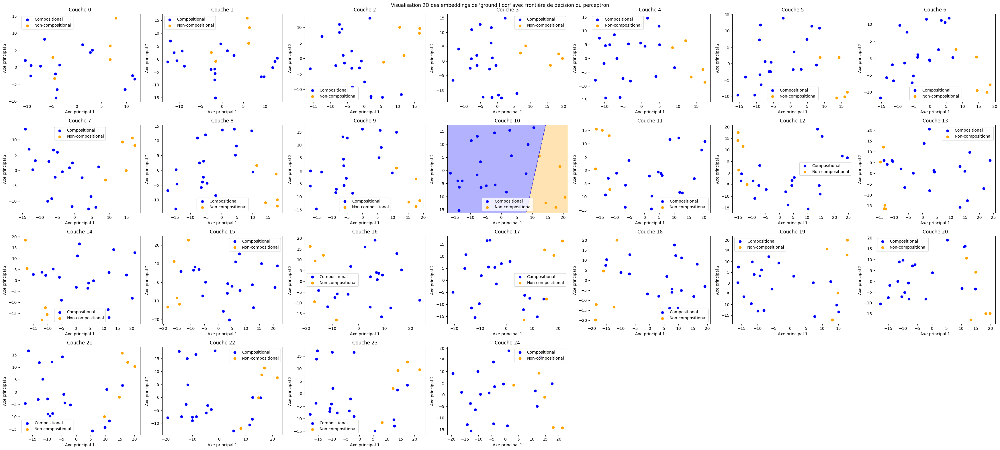

Layer 0
Training accuracy: 73.33% => data is not linearly separable.
Layer 1
Training accuracy: 80.00% => data is not linearly separable.
Layer 2
Training accuracy: 86.67% => data is not linearly separable.
Layer 3
Training accuracy: 93.33% => data is not linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly sepa

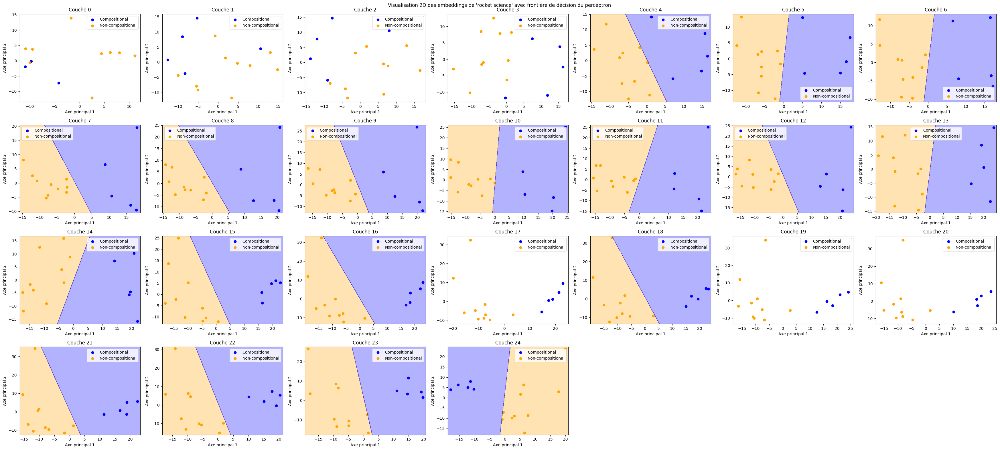

Layer 0
Training accuracy: 69.23% => data is not linearly separable.
Layer 1
Training accuracy: 84.62% => data is not linearly separable.
Layer 2
Training accuracy: 100.00% => data is linearly separable.
Layer 3
Training accuracy: 100.00% => data is linearly separable.
Layer 4
Training accuracy: 100.00% => data is linearly separable.
Layer 5
Training accuracy: 100.00% => data is linearly separable.
Layer 6
Training accuracy: 100.00% => data is linearly separable.
Layer 7
Training accuracy: 100.00% => data is linearly separable.
Layer 8
Training accuracy: 100.00% => data is linearly separable.
Layer 9
Training accuracy: 100.00% => data is linearly separable.
Layer 10
Training accuracy: 100.00% => data is linearly separable.
Layer 11
Training accuracy: 100.00% => data is linearly separable.
Layer 12
Training accuracy: 100.00% => data is linearly separable.
Layer 13
Training accuracy: 100.00% => data is linearly separable.
Layer 14
Training accuracy: 100.00% => data is linearly separable.

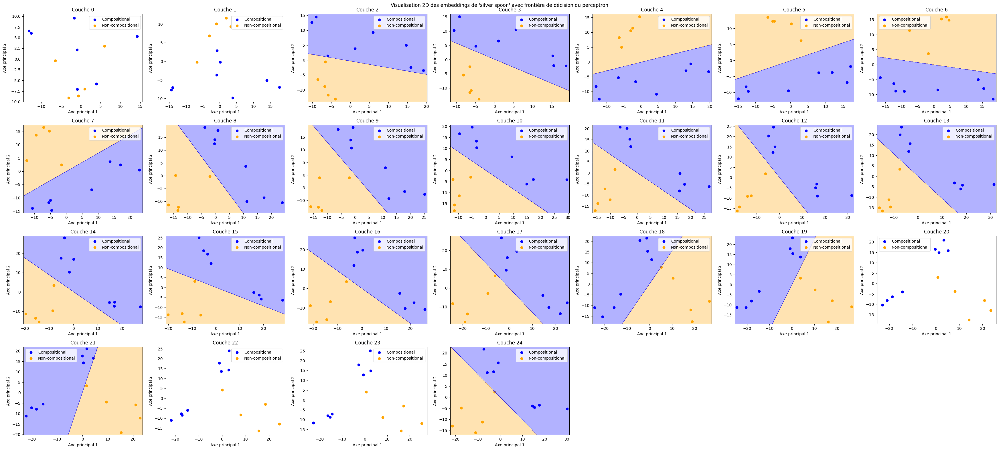

In [5]:
for mwe in pair_df.index:
  plot_decision_boundary_all_layers(mwe, data_df, tokenizer, model)

In [6]:
# Over all layers
mwes = pair_df.index.tolist()

layer_res = []
for layer_id in range(model.config.num_hidden_layers +1): # including the embedding layer
    mwe_similarities = {}
    for mwe in mwes:
            mwe_df = data_df[data_df['mwe'] == mwe].copy()
            mwe_df = retrieve_encoded_df(mwe_df, batch_size=32, layer_id=layer_id, normalize=True, print_ignored=False, tokenizer=tokenizer, model=model)
            mwe_df["combined_lit"] = mwe_df.apply(lambda row: combine_embeddings(row['literal_embedding'][0], row['literal_embedding'][1], "concatenation") if row['literal_embedding'] is not None else None, axis=1)
            mwe_df["combined_idiom"] = mwe_df.apply(lambda row: combine_embeddings(row['idiomatic_embedding'][0], row['idiomatic_embedding'][1], "concatenation") if row['idiomatic_embedding'] is not None else None, axis=1)
            centroid_lit, centroid_idiom = compute_centroids(mwe_df)
            sim = compute_centroid_cos_sim(centroid_lit, centroid_idiom)
            mwe_similarities[mwe] = sim
    layer_res.append(mwe_similarities)

mwes = sorted(list(layer_res[0].keys()))  # Sort the MWEs alphabetically
result_df = pd.DataFrame(index=mwes)

for layer_id, layer_similarities in enumerate(layer_res):
    layer_values = [layer_similarities.get(mwe, None) for mwe in mwes]
    result_df[layer_id] = layer_values

result_df

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
acid test,0.979539,0.955126,0.927935,0.912109,0.888518,0.866026,0.828152,0.773998,0.739872,0.693079,...,0.469778,0.425449,0.423813,0.397052,0.409203,0.413657,0.510894,0.540817,0.533749,0.579434
ancient history,0.974782,0.965211,0.949397,0.945514,0.930671,0.925125,0.927727,0.914186,0.903335,0.892906,...,0.748981,0.696418,0.689863,0.686710,0.677658,0.638660,0.635202,0.619819,0.608595,0.603128
baby blues,0.976344,0.961753,0.944671,0.936225,0.923999,0.901691,0.890702,0.857496,0.841887,0.836181,...,0.639392,0.632395,0.615981,0.638187,0.631488,0.612487,0.626683,0.599977,0.585602,0.625767
bad hat,0.985083,0.979253,0.973719,0.970770,0.970204,0.966862,0.962160,0.948490,0.936553,0.928376,...,0.806671,0.770374,0.746423,0.738785,0.737590,0.723463,0.744470,0.743130,0.729302,0.728113
best man,0.980560,0.970054,0.952641,0.957029,0.954103,0.948908,0.937883,0.933579,0.925373,0.905606,...,0.740823,0.696714,0.655363,0.637221,0.609928,0.587755,0.582472,0.546220,0.528386,0.536198
big cheese,0.988217,0.969511,0.955857,0.947079,0.925970,0.918440,0.910480,0.886034,0.877230,0.859405,...,0.512435,0.509158,0.481858,0.470891,0.467997,0.451046,0.507849,0.513330,0.527626,0.544768
big fish,0.975984,0.959094,0.944035,0.945481,0.944516,0.934226,0.922181,0.885566,0.869291,0.846961,...,0.556408,0.534673,0.523799,0.513727,0.498352,0.445802,0.444579,0.435833,0.432676,0.429282
big wig,0.981713,0.962659,0.946385,0.933036,0.919999,0.891721,0.849632,0.818238,0.786282,0.747869,...,0.514657,0.517077,0.494322,0.510296,0.512294,0.499626,0.539838,0.559457,0.570252,0.619577
blue blood,0.977638,0.940540,0.921426,0.908764,0.882450,0.851423,0.808620,0.764198,0.726153,0.727089,...,0.424126,0.446565,0.454696,0.442737,0.443544,0.415517,0.441403,0.443379,0.441765,0.477469
brass ring,0.987583,0.975882,0.959182,0.954216,0.947635,0.938122,0.917411,0.914662,0.886348,0.868985,...,0.756990,0.724456,0.707624,0.687228,0.683715,0.665975,0.712010,0.716515,0.721136,0.751457


In [11]:
# For the paper
mwe_stats = {}

for layer_id, layer_similarities in enumerate(layer_res):
    mwe_sims = list(layer_similarities.values())
    
    for mwe, sim in layer_similarities.items():
        if mwe not in mwe_stats:
            mwe_stats[mwe] = []
        
        mwe_stats[mwe].append(sim)

mwe_stats_series = pd.Series({mwe: [np.min(sims), np.max(sims), np.std(sims), np.median(sims)] for mwe, sims in mwe_stats.items()})

for mwe, stats in mwe_stats_series.items():
    print(f"{mwe}: min={stats[0]:.2f}, max={stats[1]:.2f}, std={stats[2]:.2f}, median={stats[3]:.2f}")


acid test: min=0.63, max=0.98, std=0.13, median=0.73
ancient history: min=0.81, max=0.98, std=0.07, median=0.88
baby blues: min=0.84, max=0.99, std=0.06, median=0.88
bad hat: min=0.91, max=0.99, std=0.03, median=0.94
best man: min=0.83, max=0.98, std=0.06, median=0.92
big fish: min=0.78, max=0.98, std=0.07, median=0.84
blue blood: min=0.66, max=0.98, std=0.12, median=0.78
brass ring: min=0.85, max=1.00, std=0.05, median=0.90
brick wall: min=0.87, max=0.99, std=0.05, median=0.91
chain reaction: min=0.72, max=0.99, std=0.10, median=0.79
closed book: min=0.76, max=0.99, std=0.08, median=0.82
cutting edge: min=0.65, max=1.00, std=0.13, median=0.78
double cross: min=0.75, max=0.99, std=0.09, median=0.83
dry land: min=0.75, max=0.98, std=0.08, median=0.81
fine line: min=0.52, max=0.99, std=0.17, median=0.73
fish story: min=0.80, max=0.98, std=0.06, median=0.88
food market: min=0.79, max=0.98, std=0.07, median=0.88
glass ceiling: min=0.82, max=0.99, std=0.06, median=0.86
gold mine: min=0.53, 

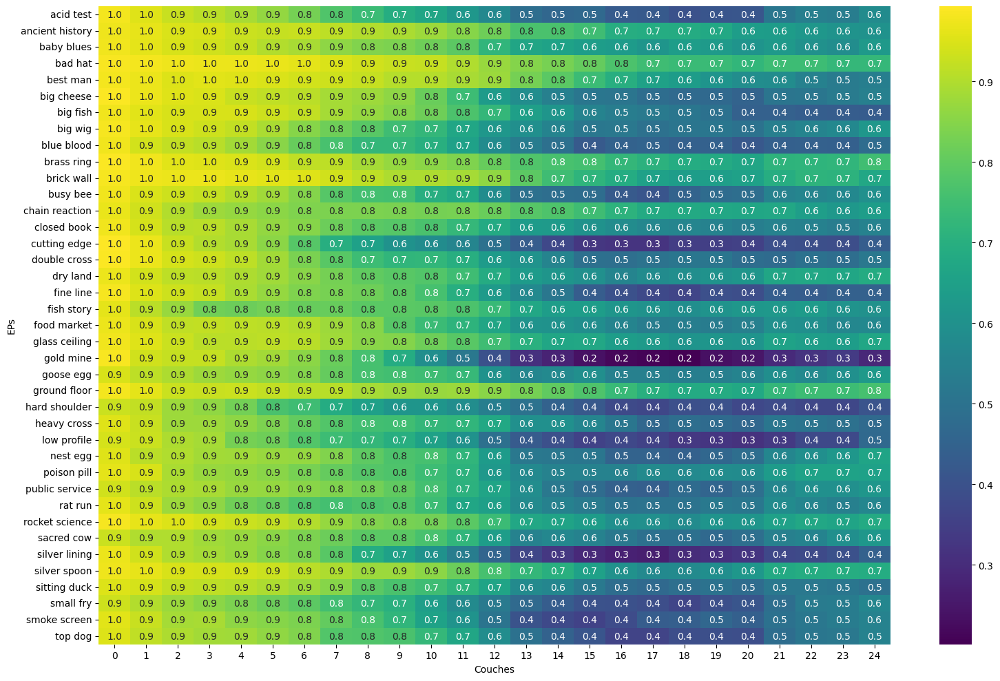

In [9]:


plt.figure(figsize=(16, 10))
sns.heatmap(result_df, cmap='viridis', annot=True, fmt=".1f")
plt.xlabel('Couches')
plt.ylabel('EPs')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"../results/plots/Heatmap-BERT-large.pdf")
plt.show()